<a href="https://colab.research.google.com/github/GoldHood/IA_NN_Projects_Colab/blob/main/07_Yolo7_PlacasPeru.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ✅ Instalar PyTorch con CUDA 11.8 (estable en SageMaker)
#!pip install torch==2.2.2+cu118 torchvision==0.17.2+cu118 torchaudio==2.2.2 --extra-index-url https://download.pytorch.org/whl/cu118 -q

# ✅ Instalar librerías adicionales
#!pip install opencv-python-headless==4.10.0.84 -q
#!pip install cython numpy Pillow matplotlib seaborn pandas tqdm pyyaml scipy thop==0.1.1.post2209072238 -q


In [2]:
# ✅ Clonar entorno para YOLOv7 + Torch con CUDA 11.8 y NumPy estable
!pip install torch==2.2.2+cu118 torchvision==0.17.2+cu118 torchaudio==2.2.2 --index-url https://download.pytorch.org/whl/cu118 -q
!pip install numpy==1.24.4 -q
!pip install opencv-python-headless==4.10.0.84 pillow matplotlib seaborn pandas tqdm pyyaml scipy thop==0.1.1.post2209072238 -q
!pip install tensorboard==2.12.0 -q
!pip uninstall -y jax jaxlib protobuf tensorflow -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.2/819.2 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 111.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 101.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 98.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 127.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 728.5/728.5 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 36.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
# ✅ Instalar PyTorch con CUDA 11.8 (Compatible en Colab)
!pip install torch==2.2.2+cu118 torchvision==0.17.2+cu118 torchaudio==2.2.2 --index-url https://download.pytorch.org/whl/cu118 -q

# 📦 Instalar NumPy compatible (1.24.4) para evitar errores con Torch
!pip install numpy==1.24.4 --force-reinstall --no-cache-dir -q

# 🧹 Eliminar JAX y TensorFlow si no los usarás (evita conflictos)
!pip uninstall -y jax jaxlib tensorflow protobuf -q

# 🧩 Instalar dependencias comunes para YOLOv7
!pip install opencv-python-headless==4.10.0.84 pillow matplotlib seaborn pandas tqdm pyyaml scipy thop==0.1.1.post2209072238 -q

# 🔁 TensorBoard (versión compatible)
!pip install tensorboard==2.12.0 -q



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 271.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboard 2.12.0 requires protobuf>=3.19.6, which is not installed.
orbax-checkpoint 0.11.13 requires jax>=0.5.0, which is not installed.
orbax-checkpoint 0.11.13 requires protobuf, which is not installed.
yfinance 0.2.61 requires protobuf>=3.19.0, which is not installed.
tensorflow-decision-forests 1.11.0 requires tensorflow==2.18.0, which is not installed.
flax 0.10.6 requires jax>=0.5.1, which is not installed.
tensorflow-datasets 4.9.8 requires protobuf>=3.20, which is not installed.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
dopamine-rl 4.1.2 requires tensorflow>=2.2.0, which is not installed.
chex 0.1.89 requires jax>=0.4.27, which is not in

In [4]:
import torch
print("✅ PyTorch:", torch.__version__)
print("🧠 GPU disponible:", torch.cuda.is_available(), "→", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "❌ CPU")


✅ PyTorch: 2.2.2+cu118
🧠 GPU disponible: True → NVIDIA A100-SXM4-40GB


In [5]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [6]:
import os

carpeta_objetivo = "/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru"

def print_drive_tree(path, max_depth=3):
    for root, dirs, files in os.walk(path):
        depth = root.replace(path, "").count(os.sep)
        if depth > max_depth:
            continue
        indent = "│   " * depth
        print(f"{indent}📂 {os.path.basename(root)}/")
        subindent = "│   " * (depth + 1)
        for f in files:
            print(f"{subindent}📄 {f}")

print("📁 Explorando:", carpeta_objetivo)
print_drive_tree(carpeta_objetivo)




📁 Explorando: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru
📂 07 - Yolo7_PlacasPeru/
│   📄 Peru Plate Numbers.v3i.yolov7pytorch.zip
│   📄 07_Yolo7_PlacasPeru.ipynb
│   📂 PlacasY7/
│   │   📄 README.dataset.txt
│   │   📄 README.roboflow.txt
│   │   📄 data.yaml
│   │   📂 test/
│   │   │   📂 images/
│   │   │   │   📄 20231009_193016_jpg.rf.ecc84edd9561e81e64af31bda2147fe5.jpg
│   │   │   │   📄 20231009_193555_jpg.rf.24aa3a00a7049e54ceb693bc204e202e.jpg
│   │   │   │   📄 20231009_193700_jpg.rf.9705574e9433dbfd1296f368ba488718.jpg
│   │   │   │   📄 20231009_194822_jpg.rf.b4bde6f4d7337a14ad8cf5b91597dd37.jpg
│   │   │   │   📄 20231009_200758_jpg.rf.4f528d61f47868a9fef8d9aac356df00.jpg
│   │   │   │   📄 20231009_202255_jpg.rf.5ee02217615e1ea5e96baafe4b2ff717.jpg
│   │   │   │   📄 20231009_202336_jpg.rf.cc22ae4c6eaa643384d3fa9adb391ecc.jpg
│   │   │   │   📄 20231009_202643_jpg.rf.fa186f3b92e2ca1ef1db7a2f0fcd777e.jpg
│   │   │   │   📄 Foto-Placa-107-_jpg.rf.77a3ee1791592c197a2d736

In [7]:
import zipfile

# Ruta correcta del ZIP
zip_path = "/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/Peru Plate Numbers.v3i.yolov7pytorch.zip"

def print_zip_tree(zip_path, max_depth=4):
    with zipfile.ZipFile(zip_path, 'r') as z:
        files = z.namelist()
        tree = {}
        for file in files:
            parts = file.strip('/').split('/')
            current = tree
            for i, part in enumerate(parts):
                if i >= max_depth:
                    break
                current = current.setdefault(part, {})

        def print_tree(d, prefix=''):
            for key in sorted(d.keys()):
                print(prefix + "├── " + key)
                print_tree(d[key], prefix + "│   ")

        print(f"📦 Estructura del ZIP: {os.path.basename(zip_path)}")
        print_tree(tree)

print_zip_tree(zip_path)


📦 Estructura del ZIP: Peru Plate Numbers.v3i.yolov7pytorch.zip
├── README.dataset.txt
├── README.roboflow.txt
├── data.yaml
├── test
│   ├── images
│   │   ├── 20231009_193016_jpg.rf.ecc84edd9561e81e64af31bda2147fe5.jpg
│   │   ├── 20231009_193555_jpg.rf.24aa3a00a7049e54ceb693bc204e202e.jpg
│   │   ├── 20231009_193700_jpg.rf.9705574e9433dbfd1296f368ba488718.jpg
│   │   ├── 20231009_194822_jpg.rf.b4bde6f4d7337a14ad8cf5b91597dd37.jpg
│   │   ├── 20231009_200758_jpg.rf.4f528d61f47868a9fef8d9aac356df00.jpg
│   │   ├── 20231009_202255_jpg.rf.5ee02217615e1ea5e96baafe4b2ff717.jpg
│   │   ├── 20231009_202336_jpg.rf.cc22ae4c6eaa643384d3fa9adb391ecc.jpg
│   │   ├── 20231009_202643_jpg.rf.fa186f3b92e2ca1ef1db7a2f0fcd777e.jpg
│   │   ├── Foto-Placa-107-_jpg.rf.77a3ee1791592c197a2d736401a05a1e.jpg
│   │   ├── Foto-Placa-127-_jpg.rf.6b1721c8552f1744bab673d565cc944d.jpg
│   │   ├── Foto-Placa-136-_jpg.rf.46ad1cc345c40f2a71cc10585a164c5e.jpg
│   │   ├── Foto-Placa-140-_jpg.rf.c199ceaf47db9cd5d9cc84705

In [8]:
with zipfile.ZipFile(zip_path, 'r') as z:
    txt_files = [f for f in z.namelist() if f.endswith('.txt')]
    print("✅ Archivos de etiqueta encontrados:" if txt_files else "❌ No se encontraron etiquetas")
    for f in txt_files[:10]:  # Muestra los primeros 10
        print("📄", f)


✅ Archivos de etiqueta encontrados:
📄 README.dataset.txt
📄 README.roboflow.txt
📄 test/labels/20231009_193016_jpg.rf.ecc84edd9561e81e64af31bda2147fe5.txt
📄 test/labels/20231009_193555_jpg.rf.24aa3a00a7049e54ceb693bc204e202e.txt
📄 test/labels/20231009_193700_jpg.rf.9705574e9433dbfd1296f368ba488718.txt
📄 test/labels/20231009_194822_jpg.rf.b4bde6f4d7337a14ad8cf5b91597dd37.txt
📄 test/labels/20231009_200758_jpg.rf.4f528d61f47868a9fef8d9aac356df00.txt
📄 test/labels/20231009_202255_jpg.rf.5ee02217615e1ea5e96baafe4b2ff717.txt
📄 test/labels/20231009_202336_jpg.rf.cc22ae4c6eaa643384d3fa9adb391ecc.txt
📄 test/labels/20231009_202643_jpg.rf.fa186f3b92e2ca1ef1db7a2f0fcd777e.txt


In [9]:
import zipfile
from pathlib import Path
import shutil

# Ruta del ZIP en Drive
zip_path = "/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/Peru Plate Numbers.v3i.yolov7pytorch.zip"

# Nuevo destino: dentro de tu Google Drive
dst_path = Path("/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7")

# Verifica si ya existe para no volver a extraer
if not dst_path.exists():
    print("📦 Extrayendo contenido del ZIP en Google Drive...")
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(dst_path)
    print("✅ Dataset extraído en:", dst_path)
else:
    print("🔁 Carpeta ya existe en Drive. No se vuelve a extraer:", dst_path)




🔁 Carpeta ya existe en Drive. No se vuelve a extraer: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7


In [10]:
import os
from pathlib import Path

# Ruta corregida al destino dentro de Drive
dst_path = Path("/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7")

def print_tree(startpath, max_depth=3):
    if not os.path.exists(startpath):
        print(f"❌ La ruta no existe: {startpath}")
        return
    for root, dirs, files in os.walk(startpath):
        depth = root.replace(startpath, "").count(os.sep)
        if depth > max_depth:
            continue
        indent = "│   " * depth
        print(f"{indent}📂 {os.path.basename(root)}/")
        subindent = "│   " * (depth + 1)
        for f in sorted(files):
            print(f"{subindent}📄 {f}")

# Ejecutar con la ruta del destino en Drive
print(f"📁 Explorando carpeta: {dst_path}\n")
print_tree(str(dst_path))


📁 Explorando carpeta: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7

📂 PlacasY7/
│   📄 README.dataset.txt
│   📄 README.roboflow.txt
│   📄 data.yaml
│   📂 test/
│   │   📂 images/
│   │   │   📄 20231009_193016_jpg.rf.ecc84edd9561e81e64af31bda2147fe5.jpg
│   │   │   📄 20231009_193555_jpg.rf.24aa3a00a7049e54ceb693bc204e202e.jpg
│   │   │   📄 20231009_193700_jpg.rf.9705574e9433dbfd1296f368ba488718.jpg
│   │   │   📄 20231009_194822_jpg.rf.b4bde6f4d7337a14ad8cf5b91597dd37.jpg
│   │   │   📄 20231009_200758_jpg.rf.4f528d61f47868a9fef8d9aac356df00.jpg
│   │   │   📄 20231009_202255_jpg.rf.5ee02217615e1ea5e96baafe4b2ff717.jpg
│   │   │   📄 20231009_202336_jpg.rf.cc22ae4c6eaa643384d3fa9adb391ecc.jpg
│   │   │   📄 20231009_202643_jpg.rf.fa186f3b92e2ca1ef1db7a2f0fcd777e.jpg
│   │   │   📄 Foto-Placa-107-_jpg.rf.77a3ee1791592c197a2d736401a05a1e.jpg
│   │   │   📄 Foto-Placa-127-_jpg.rf.6b1721c8552f1744bab673d565cc944d.jpg
│   │   │   📄 Foto-Placa-136-_jpg.rf.46ad1cc345c40f2a71cc1

In [11]:
import os

def print_folders_only(startpath, max_depth=3):
    if not os.path.exists(startpath):
        print(f"❌ La ruta no existe: {startpath}")
        return
    for root, dirs, _ in os.walk(startpath):
        depth = root.replace(startpath, "").count(os.sep)
        if depth > max_depth:
            continue
        indent = "│   " * depth
        print(f"{indent}📂 {os.path.basename(root)}/")

# Ruta a verificar
ruta = "/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7"
print(f"📁 Explorando carpetas dentro de: {ruta}\n")
print_folders_only(ruta, max_depth=5)


📁 Explorando carpetas dentro de: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7

📂 PlacasY7/
│   📂 test/
│   │   📂 images/
│   │   📂 labels/
│   📂 train/
│   │   📂 images/
│   │   📂 labels/
│   📂 valid/
│   │   📂 images/
│   │   📂 labels/


In [12]:
data_yaml_path = "/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/data.yaml"

data_yaml_content = f"""
train: PlacasY7/train/images
val: PlacasY7/valid/images
test: PlacasY7/test/images

nc: 1
names: ['placa']
"""

with open(data_yaml_path, "w") as f:
    f.write(data_yaml_content.strip())

print("✅ Archivo data.yaml creado en:", data_yaml_path)


✅ Archivo data.yaml creado en: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/data.yaml


In [14]:
from pathlib import Path

base_path = Path("/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7")

for split in ["train", "valid", "test"]:
    img_dir = base_path / split / "images"
    n_imgs = len(list(img_dir.glob("*.jpg")))
    print(f"{split.upper()}: {n_imgs} imágenes encontradas en {img_dir}")


TRAIN: 1470 imágenes encontradas en /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/train/images
VALID: 138 imágenes encontradas en /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/valid/images
TEST: 32 imágenes encontradas en /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/test/images


In [15]:
import shutil
from pathlib import Path

# Ruta de origen (Google Drive)
src = Path("/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/PlacasY7/data.yaml")

# Ruta de destino (Colab local)
dst = Path("/content/yolov7/data/peru_plate.yaml")

# Copiar si existe
if src.exists():
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy(src, dst)
    print(f"✅ Archivo copiado a: {dst}")
else:
    print(f"❌ No se encontró el archivo en: {src}")



✅ Archivo copiado a: /content/yolov7/data/peru_plate.yaml


In [16]:
# 📂 Ruta dentro de tu Drive
%cd /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru

# ✅ Clonar dentro de tu carpeta de proyecto
!git clone https://github.com/WongKinYiu/yolov7.git

# 📂 Entrar a la carpeta clonada
%cd yolov7

# 🧩 Instalar dependencias
!pip install -r requirements.txt



/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru
fatal: destination path 'yolov7' already exists and is not an empty directory.
/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 114.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.8/407.8 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 79.8 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.31.0
    Uninstalling protobuf-6.31.0:
      Successfully uninstalled protobuf-6.31.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
orbax-checkpoint 0.11.13 requires jax>=0.5.0, which is not instal

In [17]:
from pathlib import Path

# Ruta completa en tu Drive
yaml_path = Path("/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7/data/peru_plate.yaml")

# Crear carpeta si no existe
yaml_path.parent.mkdir(parents=True, exist_ok=True)

# Escribir el YAML
yaml_path.write_text(f"""
train: ../PlacasY7/train/images
val:   ../PlacasY7/valid/images
test:  ../PlacasY7/test/images

nc: 2
names: ['plate', 'otra_clase']
""".strip())

print(f"✅ YAML actualizado a 2 clases en: {yaml_path}")


✅ YAML actualizado a 2 clases en: /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7/data/peru_plate.yaml


In [18]:
# Asegúrate de estar en el directorio de trabajo correcto
%cd /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7

# Entrenamiento YOLOv7 con 2 clases
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 5 \
  --data data/peru_plate.yaml \
  --cfg cfg/training/yolov7.yaml \
  --weights yolov7.pt \
  --name yolov7_placas_2clases \
  --device 0


/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7
YOLOR 🚀 2025-5-17 torch 2.2.2+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40506.8125MB)

Namespace(weights='yolov7.pt', cfg='cfg/training/yolov7.yaml', data='data/peru_plate.yaml', hyp='data/hyp.scratch.p5.yaml', epochs=5, batch_size=16, img_size=[640, 640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=False, image_weights=False, device='0', multi_scale=False, single_cls=False, adam=False, sync_bn=False, local_rank=-1, workers=8, project='runs/train', entity=None, name='yolov7_placas_2clases', exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias='latest', freeze=[0], v5_metric=False, world_size=1, global_rank=-1, save_dir='runs/train/yolov7_placas_2clases2', total_batch_size=16)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparam

In [19]:
import torch
import numpy as np

print("🚀 PyTorch:", torch.__version__)
print("🧠 GPU disponible:", torch.cuda.is_available(), "→", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "❌ CPU")
print("🔢 NumPy:", np.__version__)


🚀 PyTorch: 2.2.2+cu118
🧠 GPU disponible: True → NVIDIA A100-SXM4-40GB
🔢 NumPy: 2.0.2


In [24]:
%cd /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7

!python detect.py \
  --weights runs/train/yolov7_placas_2clases2/weights/best.pt \
  --conf 0.4 \
  --img 640 \
  --source ../PlacasY7/test/images \
  --save-txt \
  --save-conf \
  --name inferencias_placas \
  --exist-ok






/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7
Namespace(weights=['runs/train/yolov7_placas_2clases2/weights/best.pt'], source='../PlacasY7/test/images', img_size=640, conf_thres=0.4, iou_thres=0.45, device='', view_img=False, save_txt=True, save_conf=True, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='inferencias_placas', exist_ok=True, no_trace=False)
YOLOR 🚀 2025-5-17 torch 2.2.2+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40506.8125MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.11/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36487166 parameters, 6194944 grad

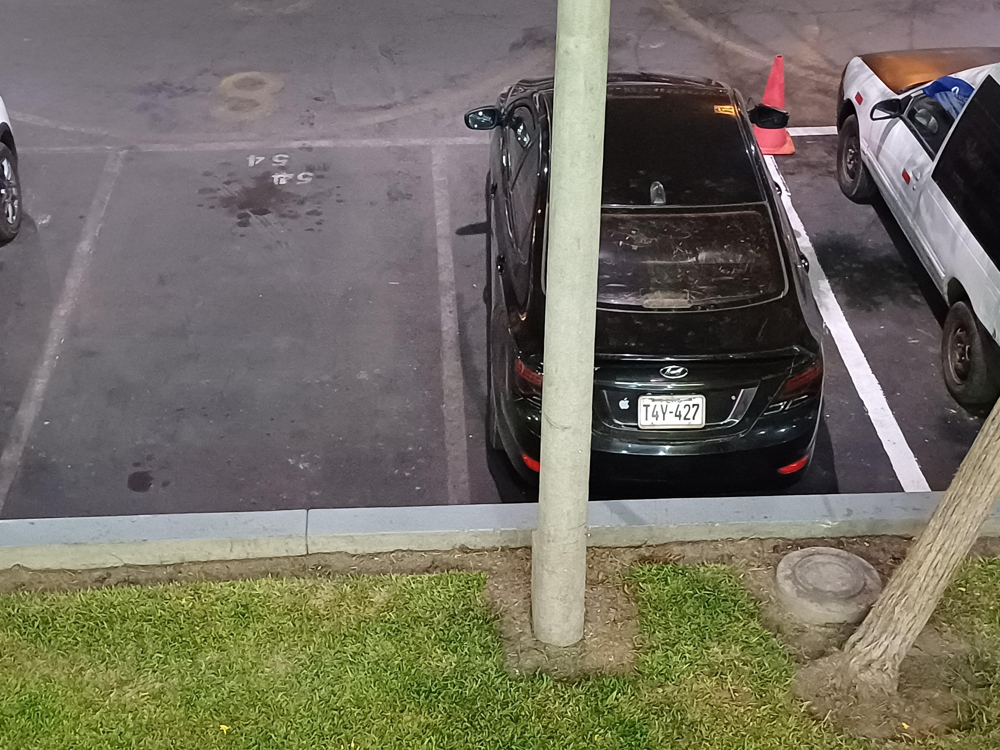

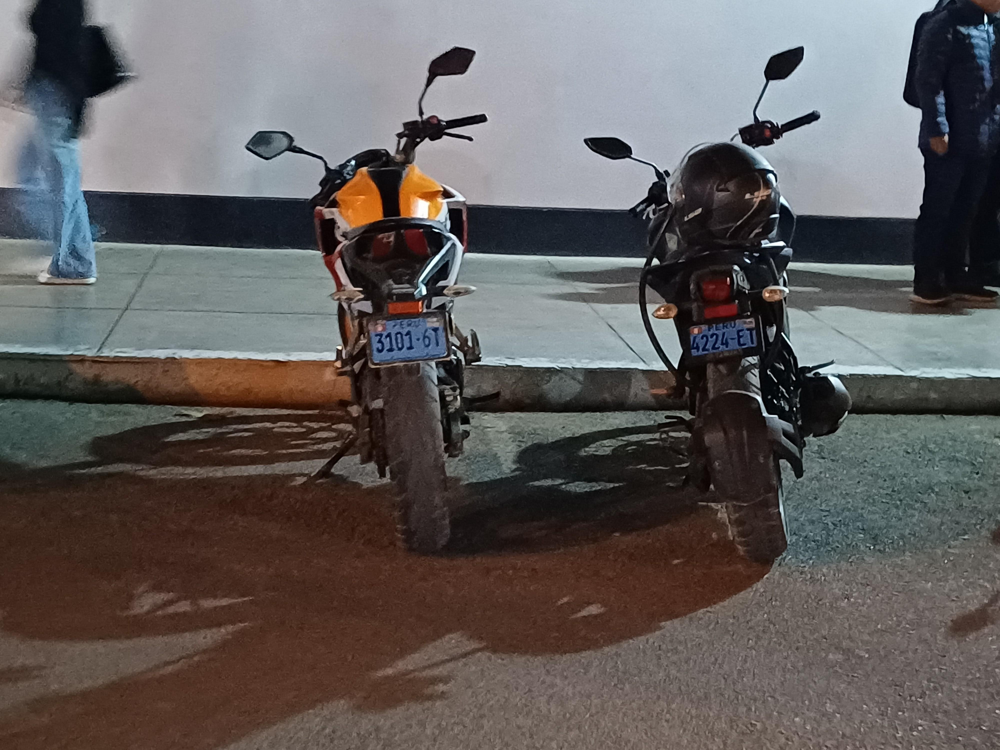

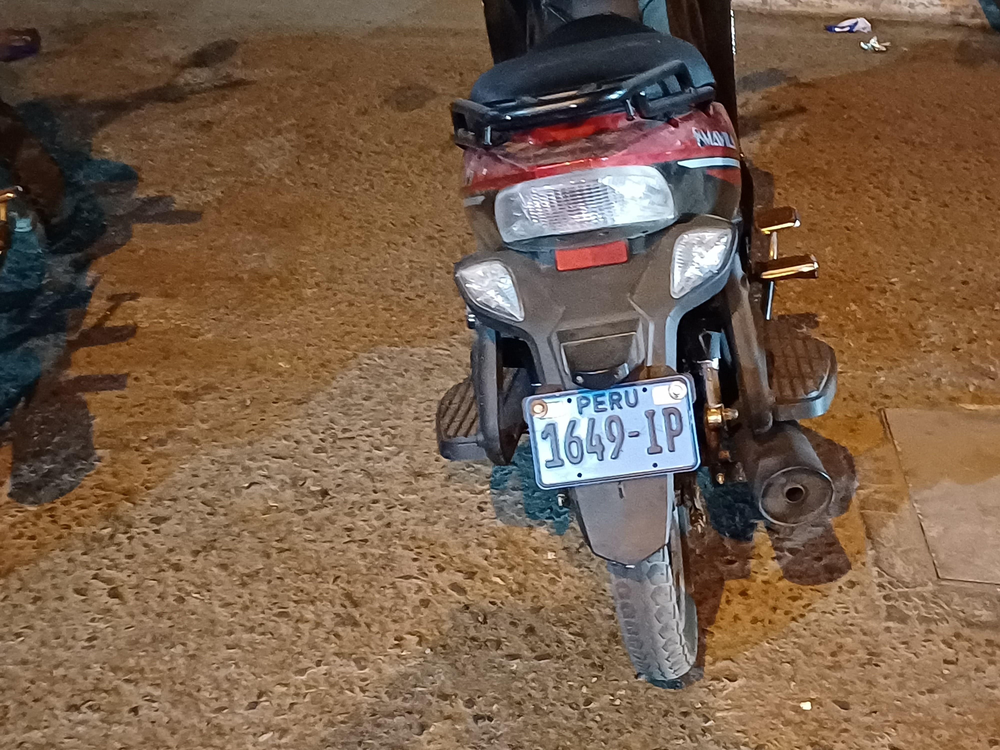

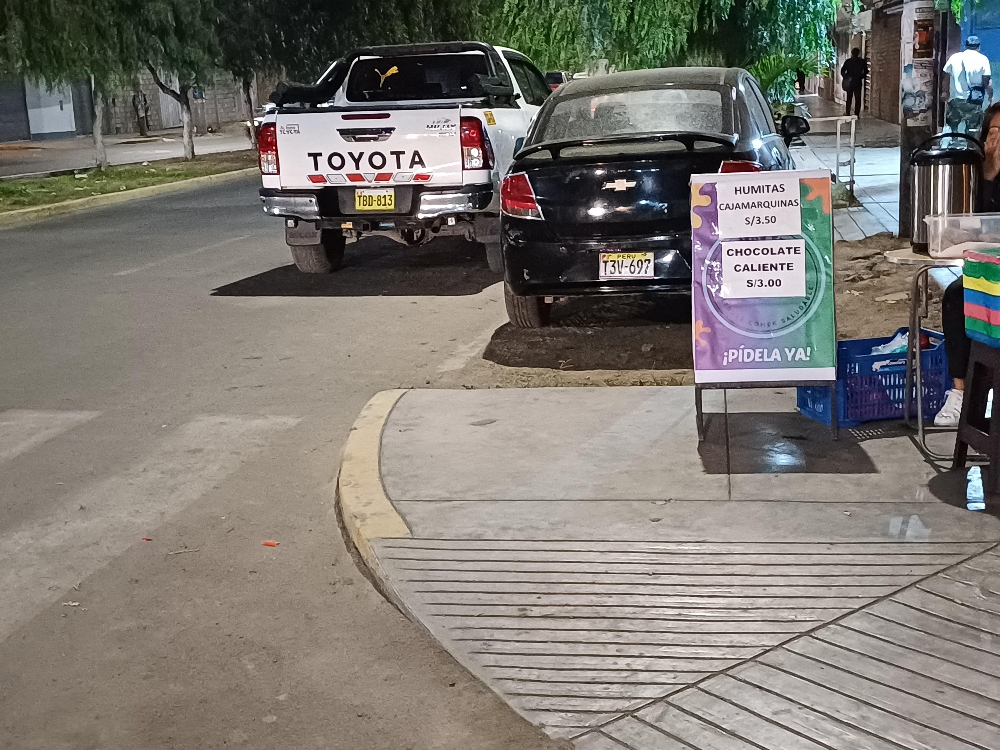

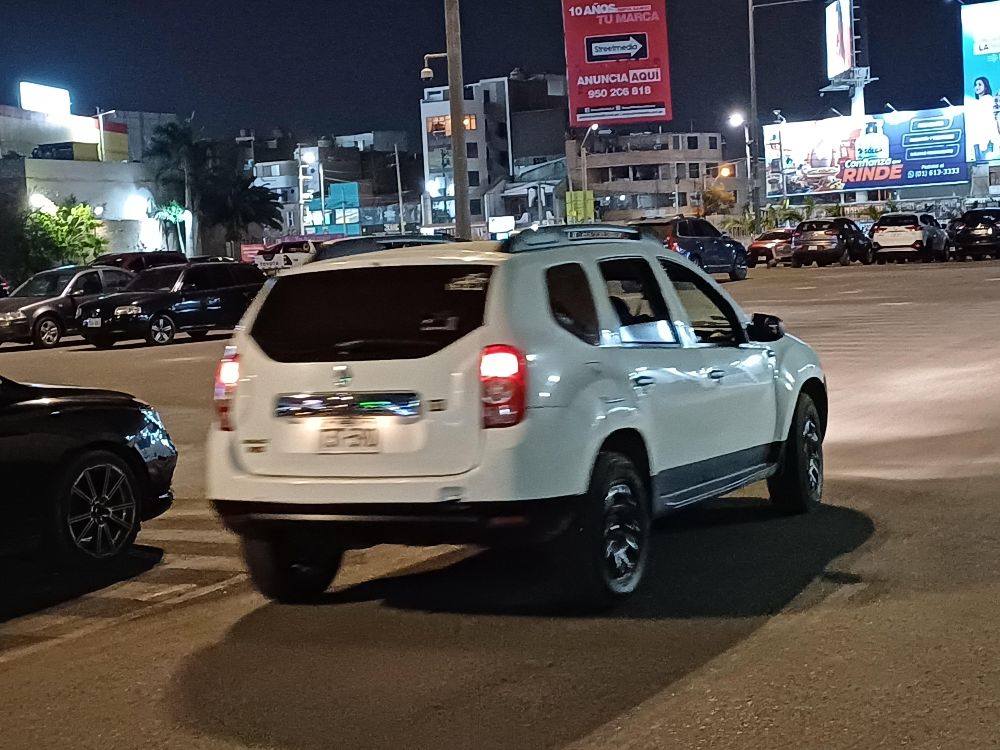

In [25]:
from IPython.display import Image, display
import glob

result_images = glob.glob('runs/detect/inferencias_placas/*.jpg')

for img_path in result_images[:5]:  # Muestra las primeras 5
    display(Image(filename=img_path))


In [26]:
# 1) Baja numpy a la versión requerida
!pip install numpy==1.23.5 -q


In [28]:
%cd /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7

!python detect.py \
  --weights runs/train/yolov7_placas_2clases2/weights/best.pt \
  --source ../testplaca2.jpg ../testplaca3.jpg \
  --img 640 \
  --conf 0.25 \
  --save-txt \
  --name predicciones_placas \
  --exist-ok

%cd ..



/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru/yolov7
usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--img-size IMG_SIZE] [--conf-thres CONF_THRES]
                 [--iou-thres IOU_THRES] [--device DEVICE] [--view-img]
                 [--save-txt] [--save-conf] [--nosave]
                 [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--update] [--project PROJECT] [--name NAME]
                 [--exist-ok] [--no-trace]
detect.py: error: unrecognized arguments: ../testplaca3.jpg
/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru


In [44]:

from google.colab import files
uploaded = files.upload()


Saving testplaca.jpg to testplaca.jpg


In [45]:
# 🔁 Asegúrate de estar en la raíz del proyecto
%cd /content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru

# 🚀 Ejecutar detección con YOLOv7
!python yolov7/detect.py \
  --weights yolov7/runs/train/yolov7_placas_2clases2/weights/best.pt \
  --source testplaca.jpg \
  --img-size 640 \
  --conf-thres 0.25 \
  --project yolov7/runs/detect \
  --name placa2 \
  --exist-ok



/content/drive/MyDrive/04 - AI_Project/07 - Yolo7_PlacasPeru
Namespace(weights=['yolov7/runs/train/yolov7_placas_2clases2/weights/best.pt'], source='testplaca.jpg', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='yolov7/runs/detect', name='placa2', exist_ok=True, no_trace=False)
YOLOR 🚀 2025-5-17 torch 2.2.2+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40506.8125MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.11/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36487166 parameters, 6194944 gradients, 103.2

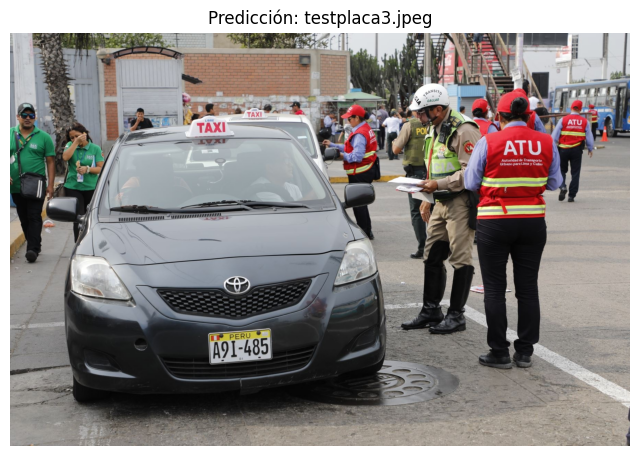

In [46]:
%matplotlib inline
from PIL import Image
import matplotlib.pyplot as plt

# Ruta al archivo generado por detect.py
img_path = "yolov7/runs/detect/placa2/testplaca.jpg"

# Cargar imagen
img = Image.open(img_path)

# Mostrar imagen
plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.title("Predicción: testplaca3.jpeg")
plt.axis("off")
plt.show()

